In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle


from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score as r2, mean_absolute_error as mae
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostClassifier, CatBoostRegressor, Pool, cv, sum_models


%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import warnings
warnings.filterwarnings('ignore')

In [2]:
TRAIN_DATASET_PATH = 'train.csv'
TEST_DATASET_PATH = 'test.csv'


In [3]:
train_df = pd.read_csv(TRAIN_DATASET_PATH)
train_df.tail()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
9995,77,32,2.0,50.401785,30.476203,5.0,6,5.0,1968,0.135650,B,B,46,7960,6,350.0,3,11,B,196684.316040
9996,6159,18,1.0,41.521546,20.539216,9.0,13,13.0,2000,0.000000,B,B,30,5562,0,NaN,0,5,A,189050.289571
9997,5123,27,1.0,47.939008,NaN,1.0,12,16.0,2015,0.072158,B,B,2,629,1,NaN,0,0,A,159143.805370
9998,5400,75,2.0,43.602562,33.840147,8.0,1,5.0,1961,0.307467,B,A,30,5048,9,325.0,2,5,B,181595.339808
9999,6306,128,1.0,38.666645,21.157874,8.0,7,17.0,1990,0.000000,B,B,27,4798,0,30.0,2,8,B,218714.077615


In [4]:
test_df = pd.read_csv(TEST_DATASET_PATH)
test_df.tail()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
4995,8180,11,3.0,67.133911,50.809797,6.0,5,9.0,1973,0.000170,B,B,36,5992,0,NaN,1,1,B
4996,4695,1,1.0,40.198472,21.807061,10.0,12,17.0,2017,0.007122,B,B,1,264,0,NaN,0,1,B
4997,5783,12,3.0,77.842178,48.282625,9.0,23,22.0,1989,0.090799,B,B,74,19083,2,NaN,5,15,B
4998,4780,62,2.0,81.305222,NaN,0.0,4,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A
4999,12504,30,2.0,60.555693,NaN,1.0,10,17.0,1977,0.000078,B,B,22,6398,141,1046.0,3,23,B


In [5]:
train_df.shape[1] -1  == test_df.shape[1]

True

In [6]:
print('Строк в train.csv:', train_df.shape[0])
print('Строк в test.csv', test_df.shape[0])

Строк в train.csv: 10000
Строк в test.csv 5000


У нас три категориальных признака = shops_2,Ecology_2 и 3. Они содержат значения А и В. Переведем их в бинарный тип

In [7]:
obj_features = train_df.select_dtypes(include='object').columns.to_list()
obj_features

['Ecology_2', 'Ecology_3', 'Shops_2']

Используем функцию по преобразованию кат. признаков в булевые

In [8]:
def obj_to_bool (columns, df):
    for column in columns:
        unique_true = df[column].unique()[1]
        df[column]  = df[column] == unique_true
    return df


In [9]:
train_df = obj_to_bool (obj_features, train_df)
test_df = obj_to_bool (obj_features, test_df)

Проверим

In [10]:
obj_features

['Ecology_2', 'Ecology_3', 'Shops_2']

In [11]:
for column in obj_features:
    print('{}\n'.format(train_df[column].value_counts()))
    obj_features

False    9903
True       97
Name: Ecology_2, dtype: int64

False    9725
True      275
Name: Ecology_3, dtype: int64

False    9175
True      825
Name: Shops_2, dtype: int64



Изменим тип нескольких категорий на числовой



In [12]:
train_df['HouseFloor'] = train_df['HouseFloor'].astype('int64')
test_df['HouseFloor'] = test_df['HouseFloor'].astype('int64')

In [13]:
train_df['Rooms'] = train_df['Rooms'].astype('int64')
test_df['Rooms'] = test_df['Rooms'].astype('int64')

In [14]:
train_df['HouseYear'] = train_df['HouseYear'].astype('int64')
test_df['HouseYear'] = test_df['HouseYear'].astype('int64')

In [15]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  int64  
 3   Square         10000 non-null  float64
 4   LifeSquare     7887 non-null   float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  int64  
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  bool   
 11  Ecology_3      10000 non-null  bool   
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

Обработка пропусков

In [16]:
(len(train_df) - train_df.count())/len(train_df)

Id               0.0000
DistrictId       0.0000
Rooms            0.0000
Square           0.0000
LifeSquare       0.2113
KitchenSquare    0.0000
Floor            0.0000
HouseFloor       0.0000
HouseYear        0.0000
Ecology_1        0.0000
Ecology_2        0.0000
Ecology_3        0.0000
Social_1         0.0000
Social_2         0.0000
Social_3         0.0000
Healthcare_1     0.4798
Helthcare_2      0.0000
Shops_1          0.0000
Shops_2          0.0000
Price            0.0000
dtype: float64

В категории lifesquare 21 процент пропусков, а в категории healthcare_1 - 47 процентов пропусков. Удалим healthcare_1, а категорию lifesquare заменим средними значениями

Добавим функцию, которая заполнит пустые значения признака LifeSquare, высчитывая его через общую площадь

In [17]:
def fill_life_square(train_df, coeff):
    train_df.loc[train_df['LifeSquare'].isnull(), 'LifeSquare'] = train_df['Square'] * coeff
    return train_df

In [18]:
square_mean_values = train_df[['Square', 'LifeSquare']].dropna().mean()
square_coeff = square_mean_values[1] / square_mean_values[0]
square_coeff


0.6734886047420221

In [19]:
fill_life_square(train_df, square_coeff)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,14038,35,2,47.981561,29.442751,6.0,7,9,1969,0.089040,False,False,33,7976,5,NaN,0,11,False,184966.930730
1,15053,41,3,65.683640,40.049543,8.0,7,9,1978,0.000070,False,False,46,10309,1,240.0,1,16,False,300009.450063
2,4765,53,2,44.947953,29.197612,0.0,8,12,1968,0.049637,False,False,34,7759,0,229.0,1,3,False,220925.908524
3,5809,58,2,53.352981,52.731512,9.0,8,17,1977,0.437885,False,False,23,5735,3,1084.0,0,5,False,175616.227217
4,10783,99,1,39.649192,23.776169,7.0,11,12,1976,0.012339,False,False,35,5776,1,2078.0,2,4,False,150226.531644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,77,32,2,50.401785,30.476203,5.0,6,5,1968,0.135650,False,False,46,7960,6,350.0,3,11,False,196684.316040
9996,6159,18,1,41.521546,20.539216,9.0,13,13,2000,0.000000,False,False,30,5562,0,NaN,0,5,True,189050.289571
9997,5123,27,1,47.939008,32.286375,1.0,12,16,2015,0.072158,False,False,2,629,1,NaN,0,0,True,159143.805370
9998,5400,75,2,43.602562,33.840147,8.0,1,5,1961,0.307467,False,True,30,5048,9,325.0,2,5,False,181595.339808


In [20]:
def fill_life_square(test_df, coeff):
    test_df.loc[test_df['LifeSquare'].isnull(), 'LifeSquare'] = test_df['Square'] * coeff
    return test_df




In [21]:
square_mean_values = test_df[['Square', 'LifeSquare']].dropna().mean()
square_coeff = square_mean_values[1] / square_mean_values[0]
square_coeff



0.652709901337597

In [22]:
fill_life_square(test_df, square_coeff)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
0,725,58,2,49.882643,33.432782,6.0,6,14,1972,0.310199,False,False,11,2748,1,NaN,0,0,False
1,15856,74,2,69.263183,45.208766,1.0,6,1,1977,0.075779,False,False,6,1437,3,NaN,0,2,False
2,5480,190,1,13.597819,15.948246,12.0,2,5,1909,0.000000,False,False,30,7538,87,4702.0,5,5,False
3,15664,47,2,73.046609,51.940842,9.0,22,22,2007,0.101872,False,False,23,4583,3,NaN,3,3,False
4,14275,27,1,47.527111,43.387569,1.0,17,17,2017,0.072158,False,False,2,629,1,NaN,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,8180,11,3,67.133911,50.809797,6.0,5,9,1973,0.000170,False,False,36,5992,0,NaN,1,1,False
4996,4695,1,1,40.198472,21.807061,10.0,12,17,2017,0.007122,False,False,1,264,0,NaN,0,1,False
4997,5783,12,3,77.842178,48.282625,9.0,23,22,1989,0.090799,False,False,74,19083,2,NaN,5,15,False
4998,4780,62,2,81.305222,53.068723,0.0,4,0,1977,0.072158,False,False,2,629,1,NaN,0,0,True


In [23]:
 train_df.drop(['Healthcare_1'], axis=1, inplace=True)

In [24]:
 test_df.drop(['Healthcare_1'], axis=1, inplace=True)

In [25]:
(len(train_df) - train_df.count())/len(train_df)

Id               0.0
DistrictId       0.0
Rooms            0.0
Square           0.0
LifeSquare       0.0
KitchenSquare    0.0
Floor            0.0
HouseFloor       0.0
HouseYear        0.0
Ecology_1        0.0
Ecology_2        0.0
Ecology_3        0.0
Social_1         0.0
Social_2         0.0
Social_3         0.0
Helthcare_2      0.0
Shops_1          0.0
Shops_2          0.0
Price            0.0
dtype: float64

Больше пропущенных данных нет.

In [26]:
test_df.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,8412.595400,51.279200,1.910000,56.449500,36.845148,5.976800,8.632000,12.601000,1984.392600,0.119874,24.933800,5406.900000,8.262600,1.31940,4.242800
std,4832.674037,44.179466,0.838594,19.092787,16.893344,9.950018,5.483228,6.789213,18.573149,0.120070,17.532202,4026.614773,23.863762,1.47994,4.777365
min,1.000000,0.000000,0.000000,1.378543,0.333490,0.000000,1.000000,0.000000,1908.000000,0.000000,0.000000,168.000000,0.000000,0.00000,0.000000
25%,4221.750000,21.000000,1.000000,41.906231,24.801216,1.000000,4.000000,9.000000,1973.000000,0.019509,6.000000,1564.000000,0.000000,0.00000,1.000000
50%,8320.500000,37.000000,2.000000,52.921340,33.782979,6.000000,7.000000,12.000000,1977.000000,0.072158,25.000000,5285.000000,2.000000,1.00000,3.000000
75%,12598.250000,77.000000,2.000000,66.285129,45.304919,9.000000,12.000000,17.000000,2000.000000,0.195781,36.000000,7287.000000,5.000000,2.00000,6.000000
max,16795.000000,212.000000,17.000000,223.453689,303.071094,620.000000,78.000000,99.000000,2020.000000,0.521867,74.000000,19083.000000,141.000000,6.00000,23.000000


In [27]:
train_df.describe()


,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.890500,56.315775,37.928033,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.839512,21.058732,76.927395,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1.493601,4.806341,92872.293865
min,0.00000,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.774881,24.836514,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.513310,33.626900,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.900625,45.345463,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,19.000000,641.065193,7480.592129,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,6.000000,23.000000,633233.466570


Поищем зависимости между признаками. Для этого добавим функцию отображения графика по нескольким признакам


In [28]:
def draw_scatter(column_x, column_y, train_df):
    plt.scatter(train_df[column_x], train_df[column_y])
    plt.xlabel(column_x)
    plt.ylabel(column_y)
    plt.show()  

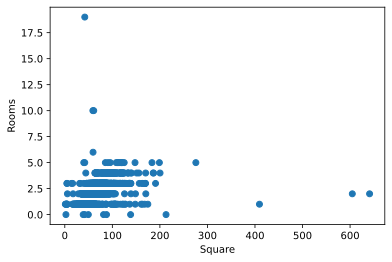

In [29]:
draw_scatter('Square', 'Rooms', train_df)

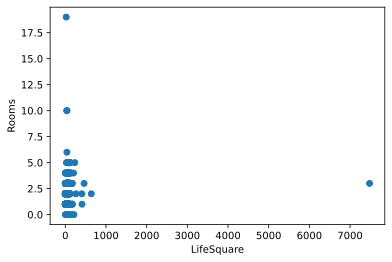

In [30]:
draw_scatter('LifeSquare', 'Rooms', train_df)

In [31]:
train_df['Rooms'].describe()


count    10000.000000
mean         1.890500
std          0.839512
min          0.000000
25%          1.000000
50%          2.000000
75%          2.000000
max         19.000000
Name: Rooms, dtype: float64

In [32]:
train_df['Square'].describe()


count    10000.000000
mean        56.315775
std         21.058732
min          1.136859
25%         41.774881
50%         52.513310
75%         65.900625
max        641.065193
Name: Square, dtype: float64

In [33]:
train_df['LifeSquare'].describe()


count    10000.000000
mean        37.928033
std         76.927395
min          0.370619
25%         24.836514
50%         33.626900
75%         45.345463
max       7480.592129
Name: LifeSquare, dtype: float64

Мы видим сильный разброс по некоторым данным, избавимся от них. Для этого добавим функцию которая уберет аномальные значения из выборки.

In [34]:
def drop_by_IQ(column, train_df):
    IQ=train_df[column].describe()['75%']-train_df[column].describe()['25%']
    low_border=train_df[column].describe()['25%']-IQ*1.5
    high_border=train_df[column].describe()['75%']+IQ*1.5
    
    print('For column {}\n\tIQ:\t{}\n\tLOW:\t{}\n\tHIGH:\t{}\n'.format(column, IQ, low_border, high_border))
    
    size_before = train_df[column].size
    train_df.drop(train_df[(train_df[column]<low_border)|(train_df[column]>high_border)].index, axis=0, inplace=True)    
    size_after = train_df[column].size
    
    lost_percentage = (size_before - size_after) * 100 / size_before 
    print('Lost {}% of data.'.format('%0.2f' % lost_percentage))

Уберем аномальные значения из выборки

In [35]:
drop_by_IQ('Square', train_df)

For column Square
	IQ:	24.125744426186976
	LOW:	5.586264180189367
	HIGH:	102.08924188493728

Lost 2.42% of data.


In [36]:
drop_by_IQ('LifeSquare', train_df)

For column LifeSquare
	IQ:	20.230855228785515
	LOW:	-5.813630654314203
	HIGH:	75.10979026082785

Lost 2.19% of data.


In [37]:
#drop_by_IQ('Rooms', train_df)

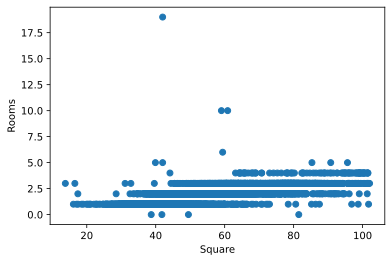

In [38]:
draw_scatter('Square', 'Rooms', train_df)

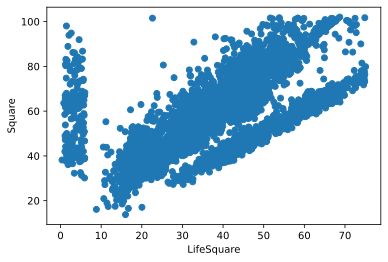

In [39]:
draw_scatter('LifeSquare', 'Square', train_df)

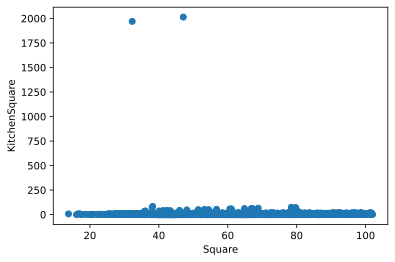

In [40]:
draw_scatter('Square', 'KitchenSquare', train_df)

In [41]:
drop_by_IQ('KitchenSquare', train_df)

For column KitchenSquare
	IQ:	8.0
	LOW:	-11.0
	HIGH:	21.0

Lost 0.32% of data.


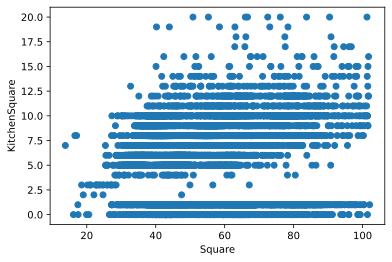

In [42]:
draw_scatter('Square', 'KitchenSquare',train_df)

Комнаты обработаем другим способом. 

In [43]:
train_df[train_df.Rooms>6]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price
377,5927,57,10,59.056975,36.223072,10.0,22,22,2002,0.090799,False,False,74,19083,2,5,15,False,317265.323792
1454,8491,1,19,42.006046,21.779288,7.0,17,17,2014,0.007122,False,False,1,264,0,0,1,False,78364.616704
8849,14865,9,10,60.871266,38.420681,10.0,3,2,1994,0.161532,False,False,25,5648,1,2,4,False,172329.270863


In [44]:
train_df[train_df.Rooms<1]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2,Price
2269,7317,27,0,41.790881,28.145682,0.0,13,0,1977,0.211401,False,False,9,1892,0,0,1,False,98129.976788
3911,770,28,0,49.483501,33.326574,0.0,16,0,2015,0.118537,False,False,30,6207,1,1,0,False,217009.338463
4366,456,6,0,81.491446,54.883561,0.0,4,0,1977,0.243205,False,False,5,1564,0,0,0,False,212864.799112
6149,3159,88,0,38.697117,19.345131,9.0,9,16,1982,0.127376,False,False,43,8429,3,3,9,False,158998.110646


In [45]:
 train_df.loc[((train_df.Rooms>6)|(train_df.Rooms==0)), 'Rooms']=2

In [46]:
 test_df.loc[((test_df.Rooms>6)|(test_df.Rooms==0)), 'Rooms']=2

 Посмотрим на корреляцию признков в датасете

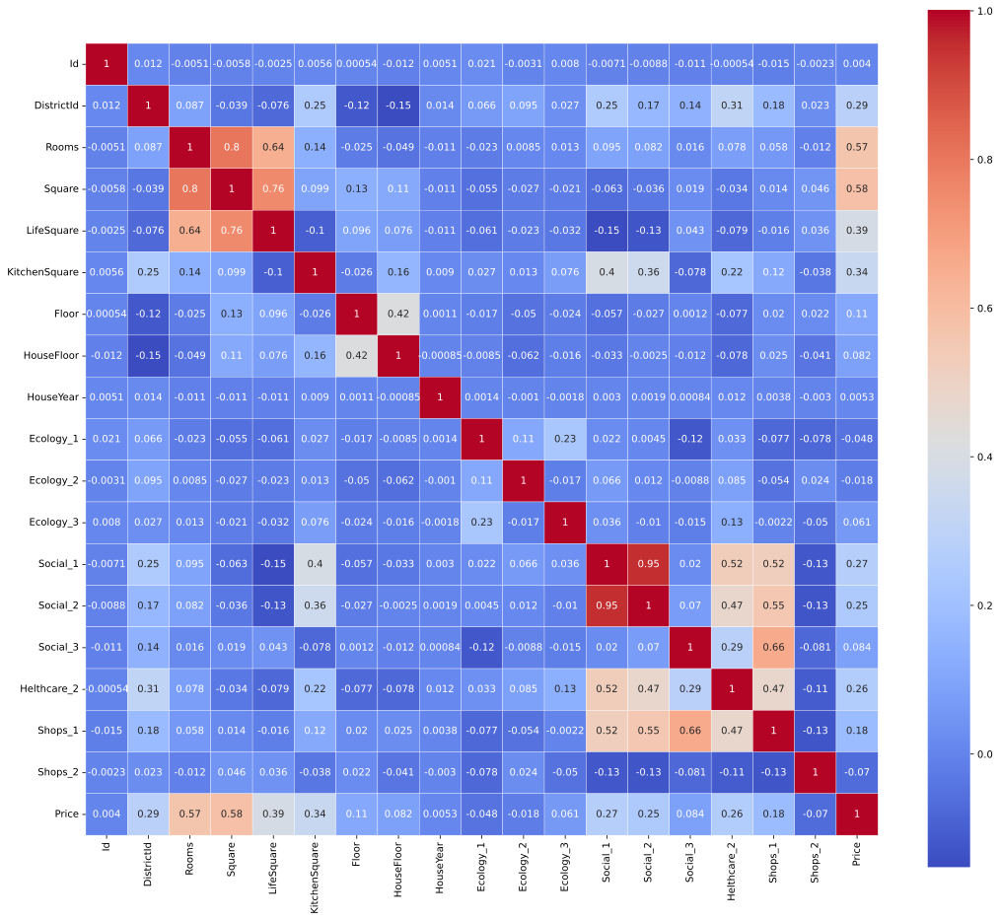

In [47]:
df_corr=train_df.corr()
plt.figure(figsize=(18,16))
sns.heatmap(df_corr, annot=True, linewidths=0.3, cmap='coolwarm', square=True)
plt.show()

Можно сделать вывод, что цена значительно зависит от количества комнат и площади

In [48]:
df_num_features=train_df.select_dtypes(include=['int64', 'float64'])

array([[<AxesSubplot:title={'center':'Id'}>,
        <AxesSubplot:title={'center':'DistrictId'}>,
        <AxesSubplot:title={'center':'Rooms'}>,
        <AxesSubplot:title={'center':'Square'}>],
       [<AxesSubplot:title={'center':'LifeSquare'}>,
        <AxesSubplot:title={'center':'KitchenSquare'}>,
        <AxesSubplot:title={'center':'Floor'}>,
        <AxesSubplot:title={'center':'HouseFloor'}>],
       [<AxesSubplot:title={'center':'HouseYear'}>,
        <AxesSubplot:title={'center':'Ecology_1'}>,
        <AxesSubplot:title={'center':'Social_1'}>,
        <AxesSubplot:title={'center':'Social_2'}>],
       [<AxesSubplot:title={'center':'Social_3'}>,
        <AxesSubplot:title={'center':'Helthcare_2'}>,
        <AxesSubplot:title={'center':'Shops_1'}>,
        <AxesSubplot:title={'center':'Price'}>]], dtype=object)

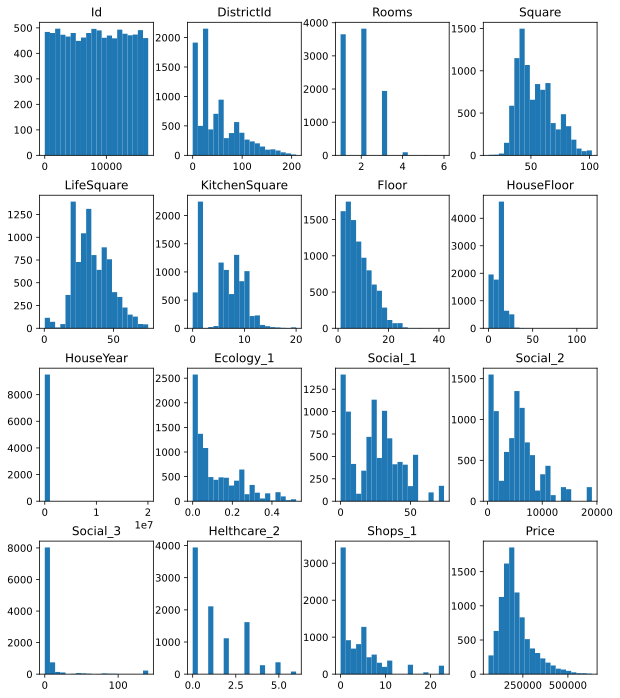

In [49]:
df_num_features.hist(figsize=(10,12), bins=20, grid=False)

Text(0.5, 1.0, 'Распределение цены относительно года постройки дома')

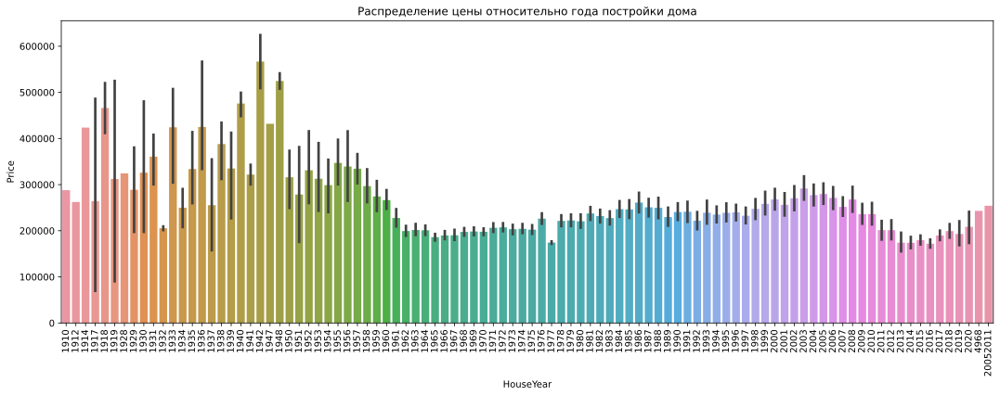

In [50]:
plt.figure(figsize=(18, 6))
sns.barplot(train_df['HouseYear'], train_df['Price'])
plt.xticks(rotation=90)
plt.title('Распределение цены относительно года постройки дома')

Значения по houseyear также выпадают. Обработаем эти данные

drop_by_IQ('HouseYear', train_df)  - такой способо слишком грубо отбрасывает данные

In [51]:
mean_year = np.round(train_df.loc[train_df['HouseYear'] <= 2020, 'HouseYear'].mean())
mean_year

1984.0

In [52]:
def clean_year(train_df, mean_year):
    train_df.loc[train_df['HouseYear'] > 2020, 'HouseYear'] = mean_year

In [53]:
clean_year(train_df, mean_year)

Text(0.5, 1.0, 'Распределение цены относительно года постройки дома')

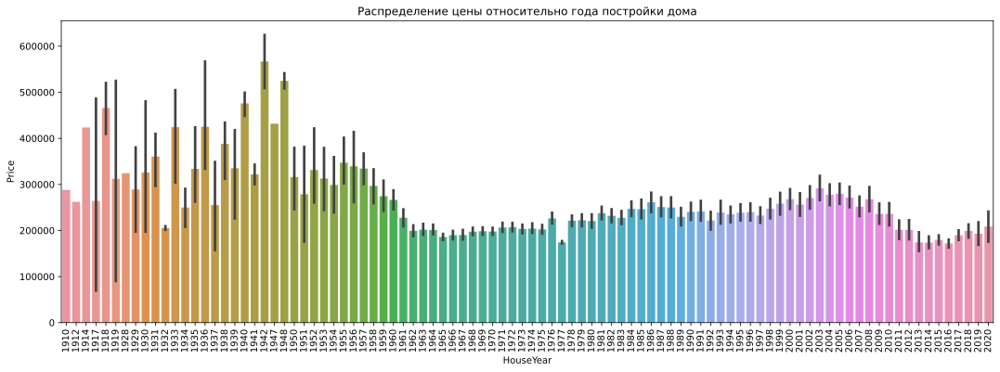

In [54]:
plt.figure(figsize=(18, 6))
sns.barplot(train_df['HouseYear'], train_df['Price'])
plt.xticks(rotation=90)
plt.title('Распределение цены относительно года постройки дома')

Text(0.5, 1.0, 'District Id')

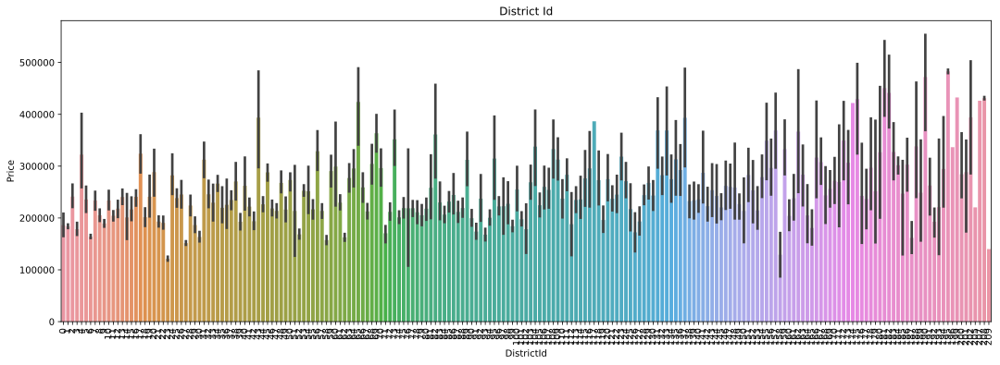

In [55]:
plt.figure(figsize=(18, 6))
sns.barplot(train_df['DistrictId'], train_df['Price'])
plt.xticks(rotation=90)
plt.title('District Id')

Проанализировав все данные, можно сделать вывод, что датасет обработан: категориальные признаки заменены на бинарные. Признак где было много пропусков исключен, в некоторых признаках были исключены выбросы и тд.

In [56]:
test_df.shape


(5000, 18)

In [57]:
train_df.shape

(9513, 19)

In [58]:
train_df.columns#.tolist()

Index(['Id', 'DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare',
       'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
       'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Helthcare_2',
       'Shops_1', 'Shops_2', 'Price'],
      dtype='object')

In [59]:
feature_names = [ 'DistrictId', 'Rooms',  'Square', 'LifeSquare',
       'KitchenSquare', 'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1',
       'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 'Social_3',
       'Helthcare_2', 'Shops_1', 'Shops_2']

In [60]:
target_name='Price'

In [61]:
train_df= train_df[feature_names+ [target_name]]

Разбиение на train и test

In [62]:
X = train_df[feature_names]

In [63]:
y = train_df[target_name]

In [64]:
X_train, X_test, y_train, y_test = train_test_split (X, y, test_size=0.33, shuffle=True, random_state=21)

In [65]:
def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values):
    print("Train R2:\t" + str(round(r2(train_true_values, train_pred_values), 3)))
    print("Test R2:\t" + str(round(r2(test_true_values, test_pred_values), 3)))
    
    plt.figure(figsize=(8,8))
    
    plt.subplot(121)
    sns.scatterplot(x=train_pred_values, y=train_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Train sample prediction')
    
    plt.subplot(122)
    sns.scatterplot(x=test_pred_values, y=test_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Test sample prediction')

    plt.show()

Попробуем разные модели

In [103]:
rf_model = RandomForestRegressor( random_state=21, n_estimators=200, max_depth=19, max_features=7, criterion='mse')
rf_model.fit(X_train, y_train)

RandomForestRegressor(criterion='mse', max_depth=19, max_features=7,
                      n_estimators=200, random_state=21)

Train R2:	0.958
Test R2:	0.729


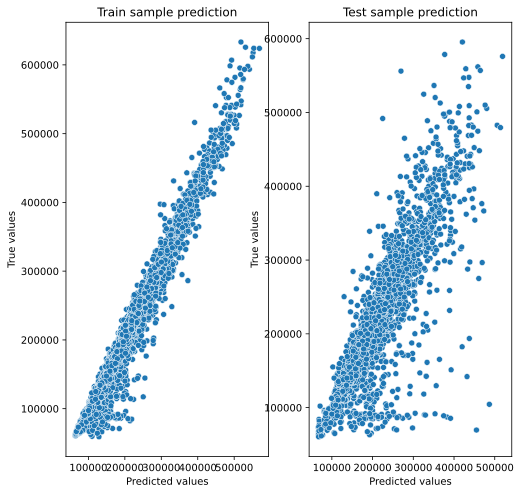

In [67]:
y_train_preds = rf_model.predict(X_train)
y_test_preds = rf_model.predict(X_test)

evaluate_preds(y_train, y_train_preds, y_test, y_test_preds)

Кросс-валидация

In [68]:
cv_score = cross_val_score(rf_model, X, y, scoring='r2', cv=KFold(n_splits=3, shuffle=True, random_state=21))
cv_score

array([0.72559197, 0.72495113, 0.71265707])

In [69]:
cv_score.mean()

0.7210667231469303

Важность признаков

In [70]:
feature_importances = pd.DataFrame(zip(X_train.columns, rf_model.feature_importances_), columns=['feature_name', 'importance'])

feature_importances.sort_values(by='importance', ascending=False)

,feature_name,importance
2,Square,0.263270
1,Rooms,0.111989
12,Social_2,0.092657
11,Social_1,0.085319
13,Social_3,0.075740
3,LifeSquare,0.074182
0,DistrictId,0.055962
4,KitchenSquare,0.048835
7,HouseYear,0.046445
8,Ecology_1,0.046100


In [71]:
submit = pd.read_csv('sample_submission.csv')
submit.shape


(5000, 2)

In [72]:
submit = pd.read_csv('sample_submission.csv')
submit.head()

,Id,Price
0,725,200000.0
1,15856,200000.0
2,5480,200000.0
3,15664,200000.0
4,14275,200000.0


In [76]:
test_df=test_df[feature_names]

Попробуем GradientBoostingRegressor

In [95]:
gb_model = GradientBoostingRegressor(criterion = 'mse',
                                     min_samples_leaf = 180,
                                     random_state=21,  
                                     n_estimators=4250, 
                                     max_features='sqrt', 
                                     loss='huber',
                                     learning_rate=0.1)

IndentationError: unexpected indent (3344074440.py, line 2)

In [74]:
gb_model.fit(X_train, y_train)

GradientBoostingRegressor(criterion='mse', loss='huber', max_features='sqrt',
                          min_samples_leaf=180, n_estimators=4250,
                          random_state=21)

Train R2:	0.832
Test R2:	0.745


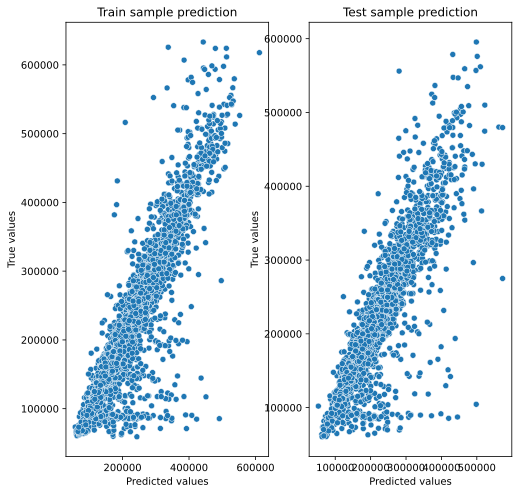

In [75]:
y_train_preds = gb_model.predict(X_train)
y_valid_preds = gb_model.predict(X_test)

evaluate_preds(y_train, y_train_preds, y_test, y_valid_preds)


In [77]:
submit = pd.read_csv('sample_submission.csv')
submit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      5000 non-null   int64  
 1   Price   5000 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 78.2 KB


In [96]:
cb_model = CatBoostRegressor(iterations=20000,
                           grow_policy="Depthwise",
                           loss_function = 'RMSE',
                           eval_metric = 'R2',
                           early_stopping_rounds = 1000,
                           verbose = False,
                          
                         )

In [97]:
cb_model

In [98]:
cb_model.fit(X_train, y_train)

Train R2:	0.977
Test R2:	0.73


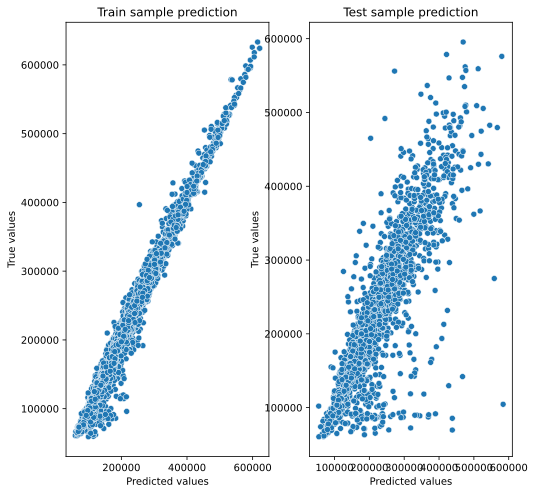

In [99]:
y_train_preds = cb_model.predict(X_train)
y_valid_preds = cb_model.predict(X_test)

evaluate_preds(y_train, y_train_preds, y_test, y_valid_preds)

In [100]:
predictions = cb_model.predict(test_df)
predictions



array([154549.9871974 , 227248.85744996, 274790.70586974, ...,
       322708.33475059, 186322.78963493, 183782.97192414])

In [101]:
submit['Price'] = predictions
submit.head()

,Id,Price
0,725,154549.987197
1,15856,227248.857450
2,5480,274790.705870
3,15664,344324.932513
4,14275,145133.890566


In [102]:
submit.to_csv('cb_submit2.csv', index=False)

CatBoostRegressor показал наилучшие результаты

Kaggle Score: 0.73728